In [62]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')
sys.path.append('../hovernet')
sys.path.append('../deconvplugin')

import json
import os
import pickle
import torch
import scanpy as sc

PATH = '/home/luca/Documents/data/'

#'/cluster/CBIO/data1/lgortana/'
#'/home/luca/Documents/data/'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load data

In [63]:
# names
adata_name = 'Xenium_V1_humanLung_Cancer_FFPE'
atlas_name = 'LuCA'
sim_tag = 'grouped'
model_tag = 'test'

In [64]:
import pandas as pd

data_path = os.path.join(PATH, adata_name)
sim_path = os.path.join(data_path, "sim", atlas_name)

#load images
image_path = os.path.join(data_path, 'tif', 'Xenium_V1_humanLung_Cancer_FFPE_he_image.ome.tif')
image_dict = torch.load(os.path.join(sim_path, 'image_dict_64.pt'))

#load ground truth
ground_truth = pd.read_csv(os.path.join(sim_path, f'sim_{adata_name}_gt.csv'), index_col=0)
ground_truth.index = ground_truth.index.astype(str)

In [65]:
#load adata
path_ST_adata = os.path.join(sim_path, f"pseudo_adata_{sim_tag}.h5ad")
adata = sc.read_h5ad(path_ST_adata)

#load proportions
spot_prop_df = pd.read_csv(os.path.join(sim_path, f'sim_{adata_name}_prop_{sim_tag}.csv'), index_col=0)
spot_prop_df.index = spot_prop_df.index.astype(str)
ct_list = list(spot_prop_df.columns)

#load segmentation
json_path = os.path.join(sim_path, "pannuke_fast_mask_lvl3_annotated.json")
with open(json_path) as json_file:
    hovernet_dict = json.load(json_file)

#color_dict annotated hovernet
from deconvplugin.basics import generate_color_dict
dict_types_colors = generate_color_dict(ct_list, format='special')
dict_types_colors[f'{len(ct_list)}'] = ['low_counts', [0, 0, 0, 255]]
dict_types_colors[f'{len(ct_list)+1}'] = ['no_match', [170, 170, 170, 255]]

# Annotated Xenium data (ground truth)

In [5]:
from deconvplugin.analysis.postseg import StdVisualizer

plotter = StdVisualizer(image_path=image_path,
                        adata=adata,
                        adata_name=adata_name,
                        seg_dict=hovernet_dict,
                        color_dict=dict_types_colors)

Visium data found.


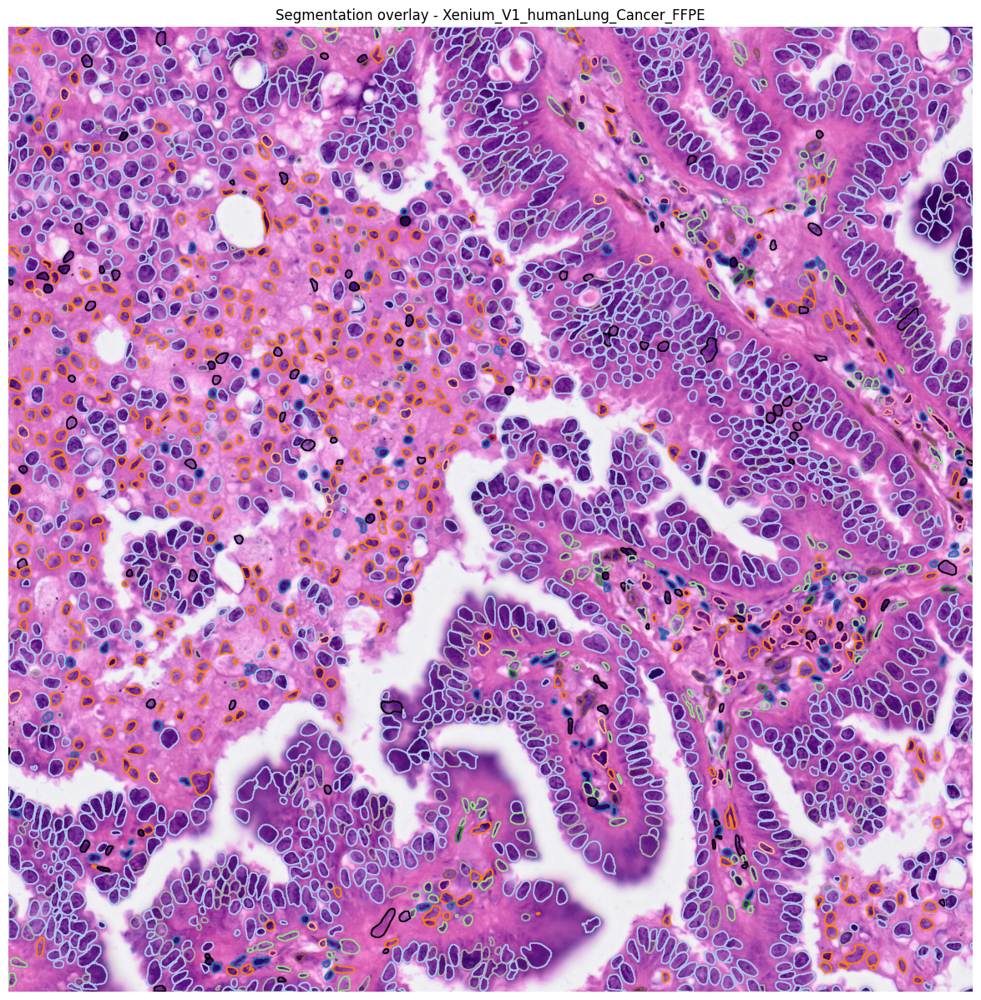

In [6]:
window = ((3000, 20000), (2000, 2000)) #((3000, 20000), (2000, 2000))
plotter.plot_seg(window=window, show_visium=False, display=True)
# fig.savefig("../../data-simulation-xenium/fig/Xenium_humanLung_Cancer_annotated_LuCA2.png", dpi=300, bbox_inches='tight')

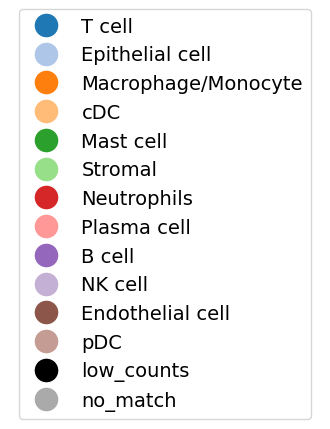

In [7]:
from deconvplugin.analysis.plots import plot_legend

plot_legend(dict_types_colors)

# Model predictions

In [96]:
#load model infos
model_dir = os.path.join('../models', model_tag)

with open(os.path.join(model_dir, 'info.pickle'), 'rb') as f:
    model_info = pickle.load(f)

In [109]:
from deconvplugin.analysis.pred_analyzer import PredAnalyzer

analyzer = PredAnalyzer(model_info=model_info,
                        adjusted=False,
                        ground_truth=ground_truth, 
                        image_dict=image_dict
                        )

Loading predicted labels...
Loading true labels...
Use `add_attributes(seg_dict=your_seg_dict)` to add one.


In [110]:
pd.DataFrame(analyzer.proportions.mean(axis=0)).T

,T cell,Epithelial cell,Macrophage/Monocyte,cDC,Mast cell,Stromal,Neutrophils,Plasma cell,B cell,NK cell,Endothelial cell,pDC
0,0.077654,0.598289,0.076439,0.00991,0.010528,0.14946,0.002283,0.01483,0.006139,0.000898,0.053457,0.000114


In [111]:
analyzer.add_attributes(adata=adata,
                        adata_name=adata_name,
                        image_path=image_path,
                        seg_dict=hovernet_dict)

In [112]:
from deconvplugin.analysis.postseg import StdVisualizer

plotter = StdVisualizer(image_path, 
                        adata, 
                        adata_name, 
                        seg_dict=analyzer.seg_dict_w_class,
                        color_dict=analyzer.color_dict)

Visium data found.


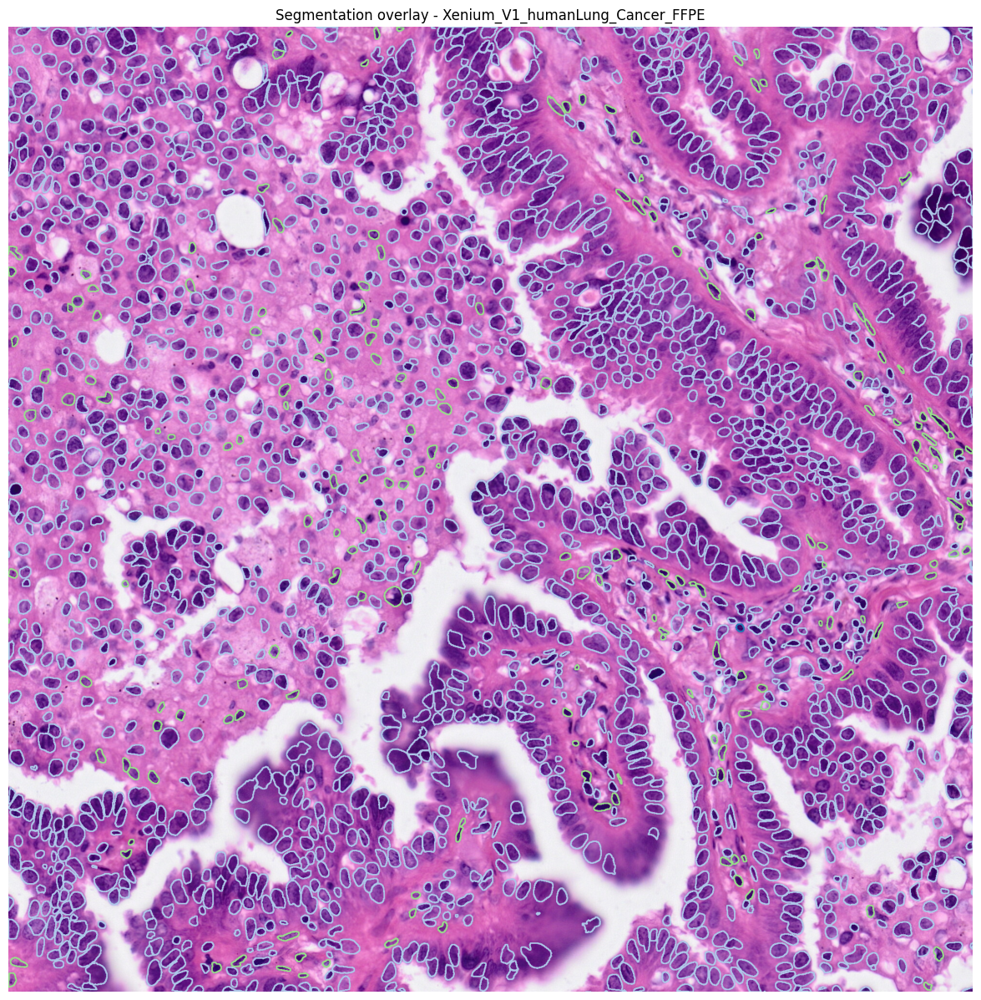

In [113]:
window = ((3000, 20000), (2000, 2000)) #((6000, 20000), (2000, 2000))
plotter.plot_seg(window=window, show_visium=False, display=True)

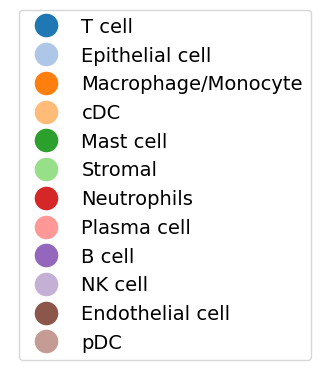

In [114]:
plot_legend(analyzer.color_dict)

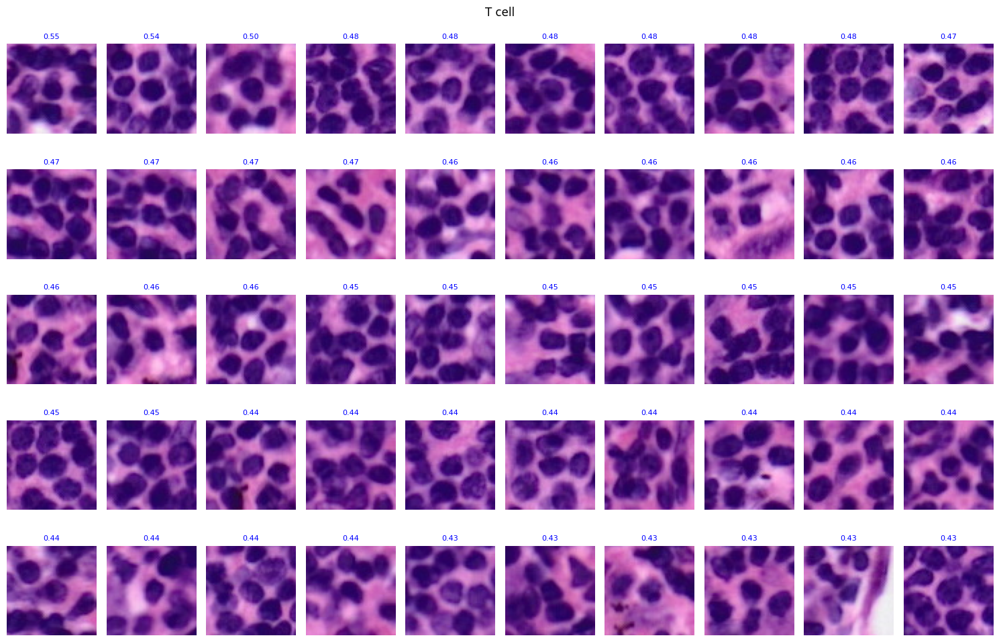

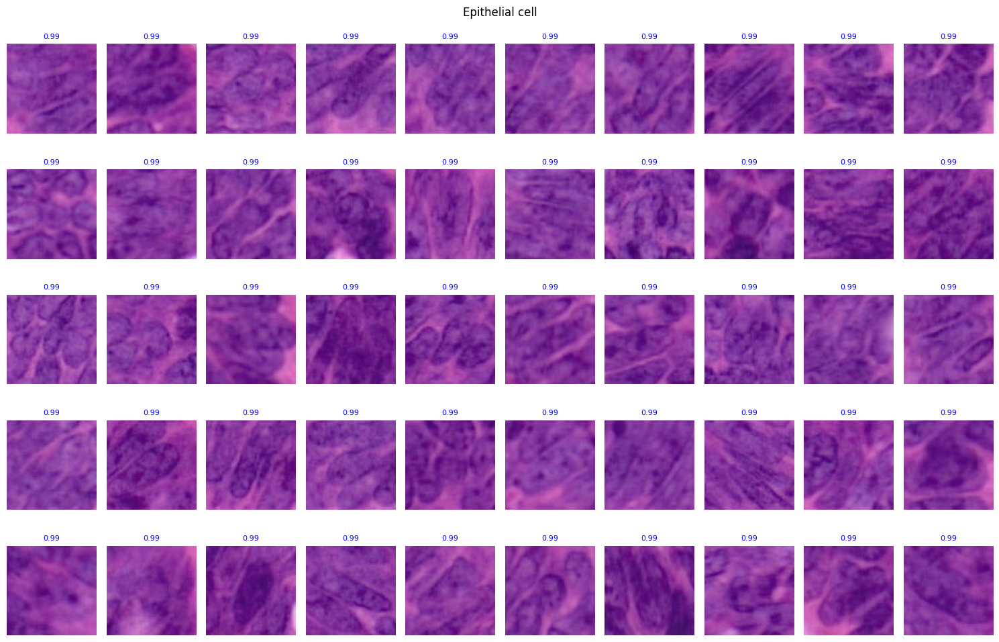

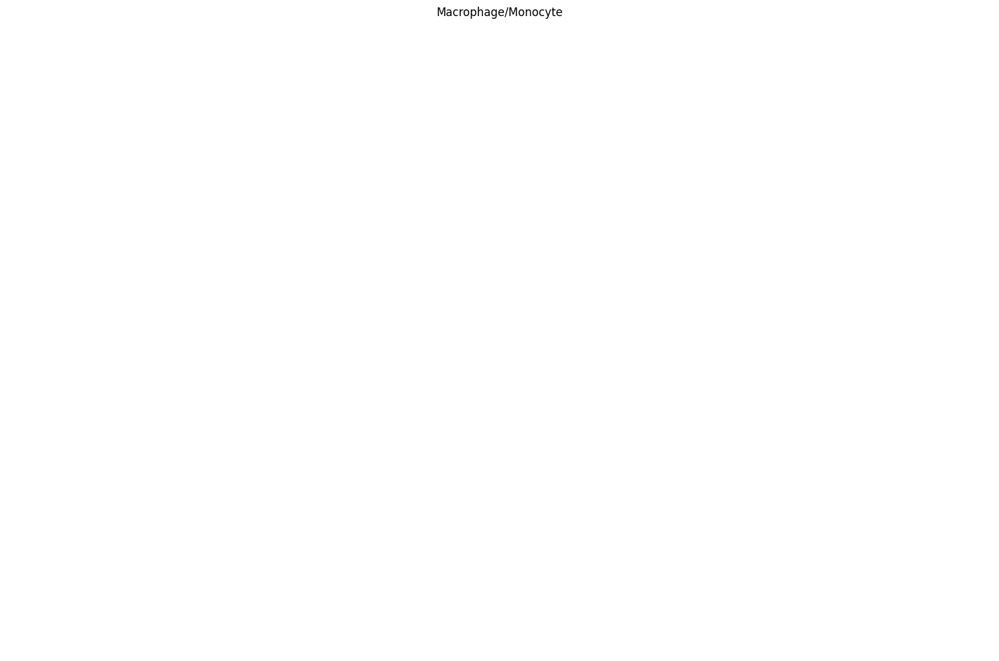

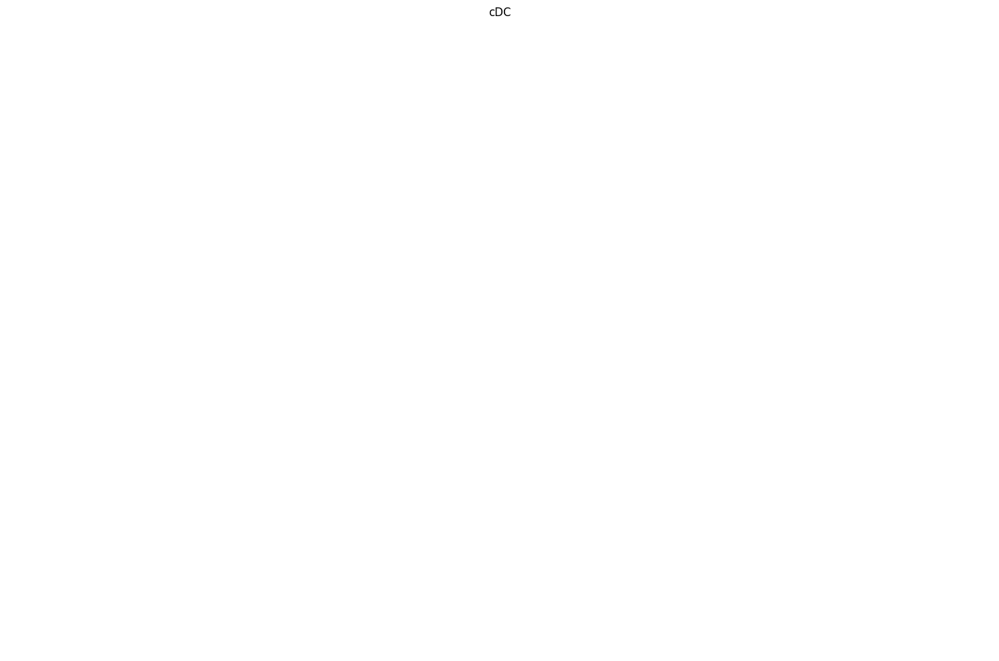

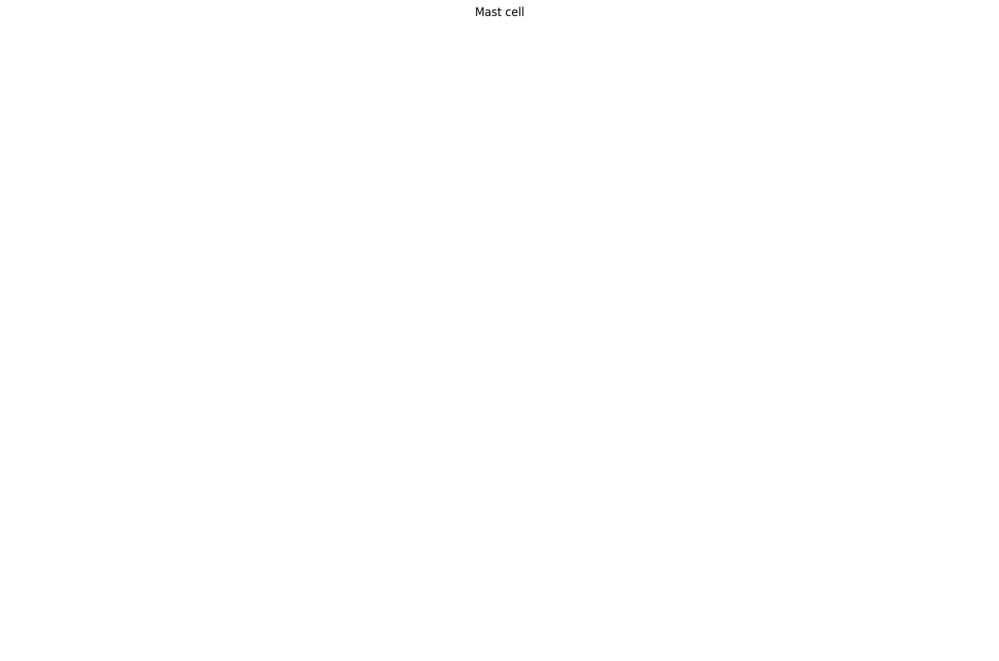

...

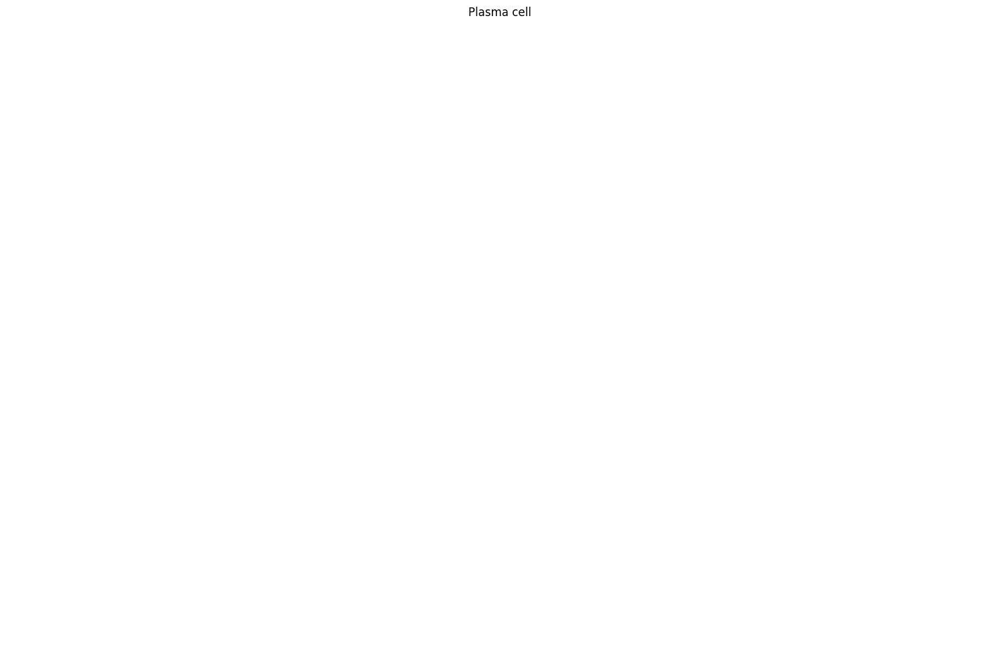

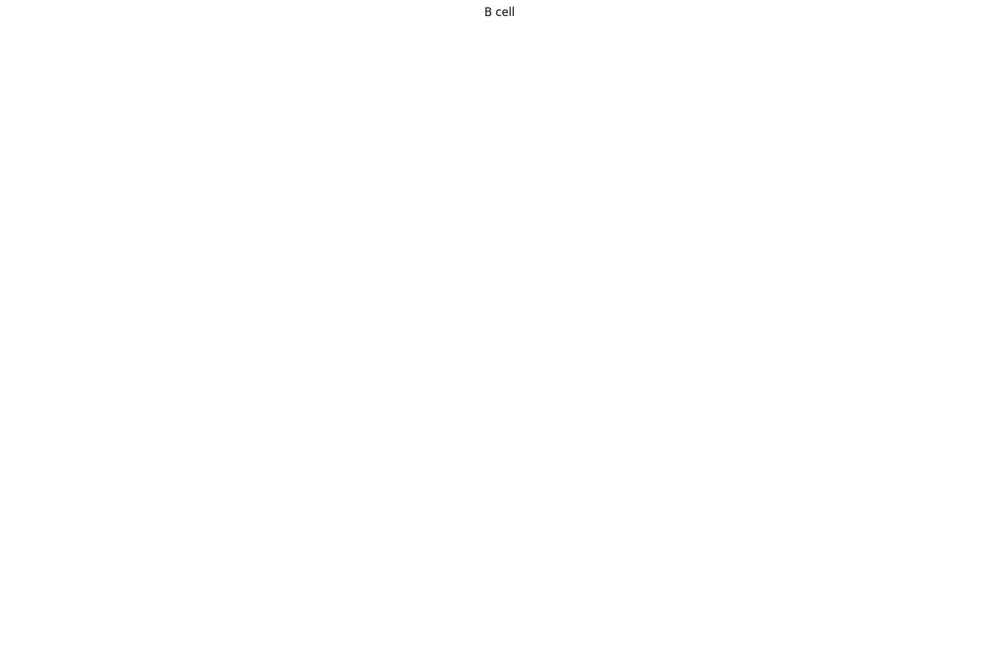

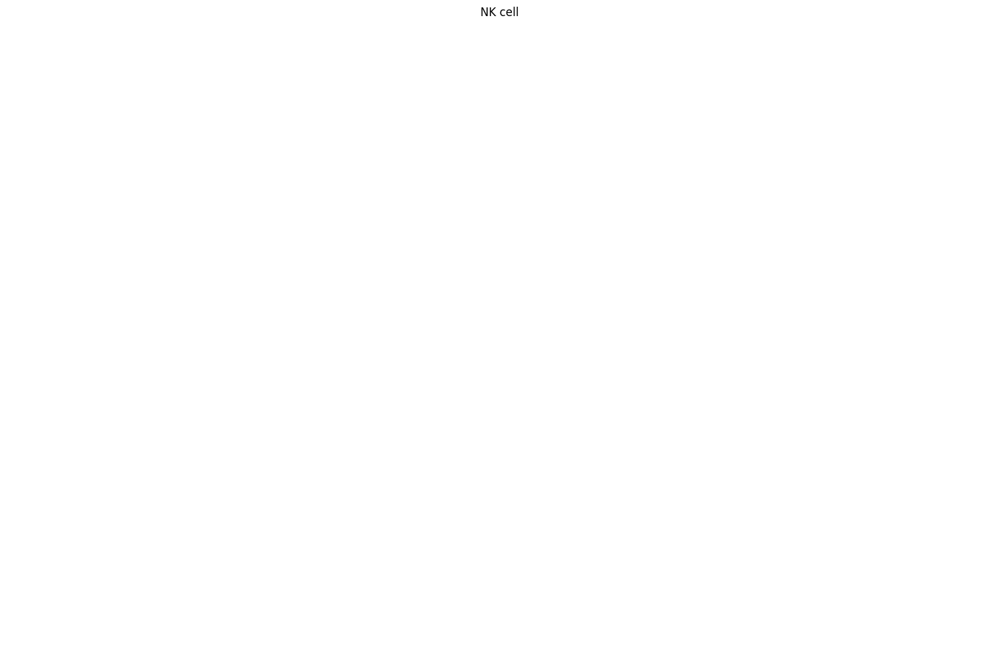

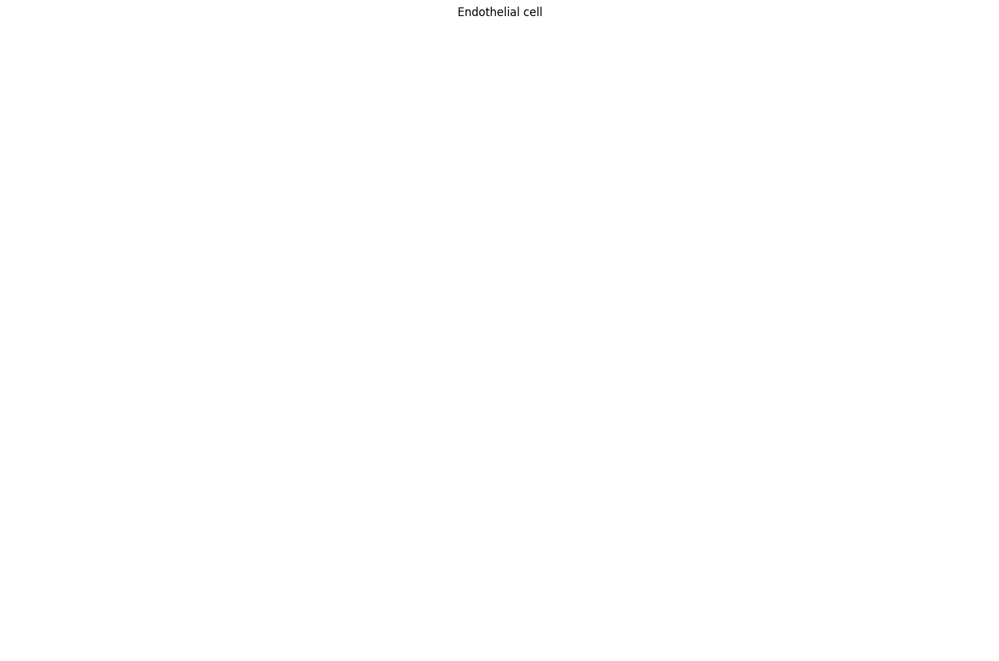

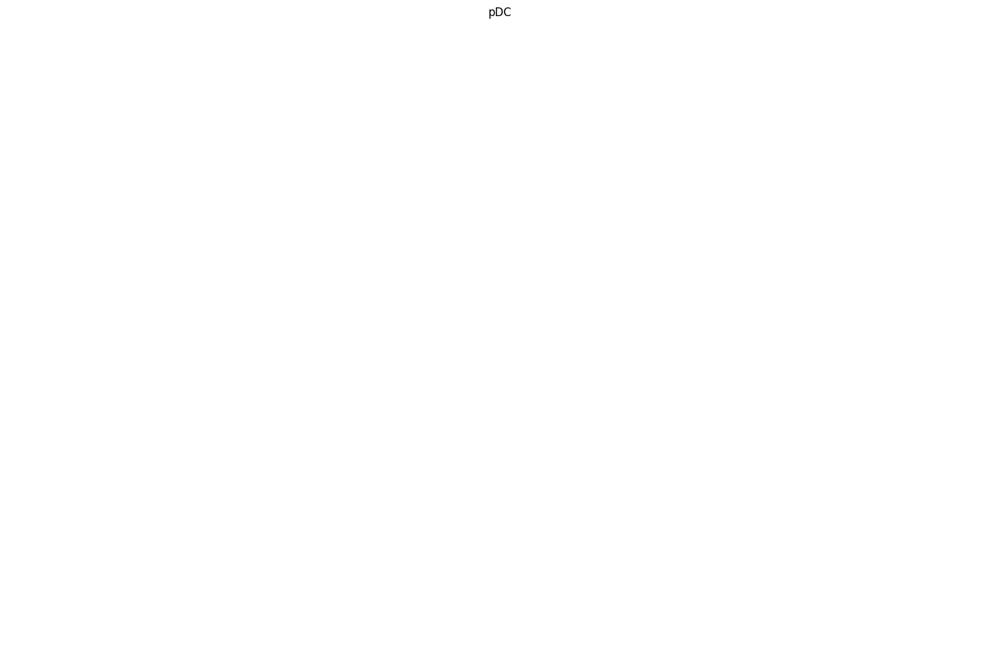

In [115]:
for ct in analyzer.ct_list:
    analyzer.plot_grid_celltype(cell_type=ct, n=50, selection="max", display=True)

Visium data found.


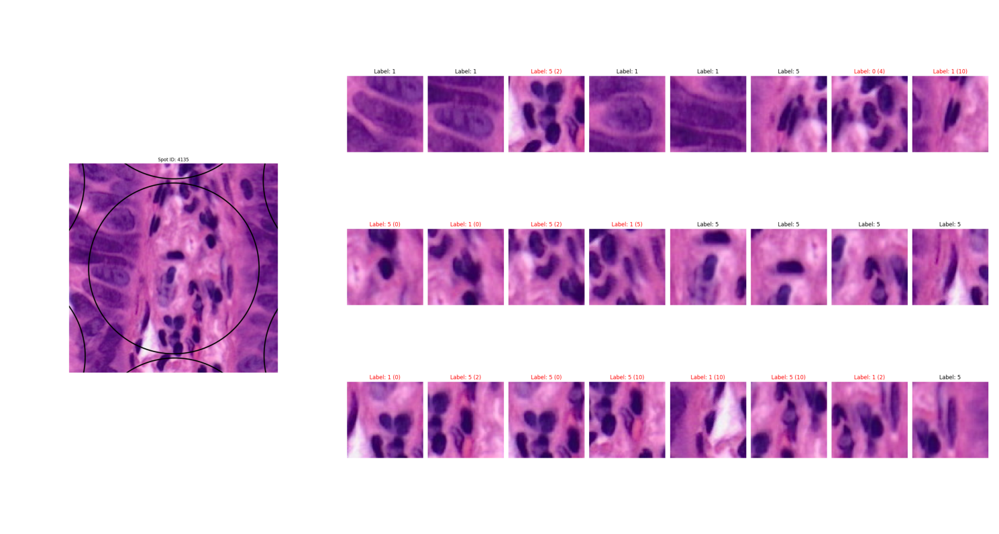

In [116]:
analyzer.plot_predicted_cell_labels_in_spot(spot_id='4135', show_labels=True, display=True)

Visium data found.


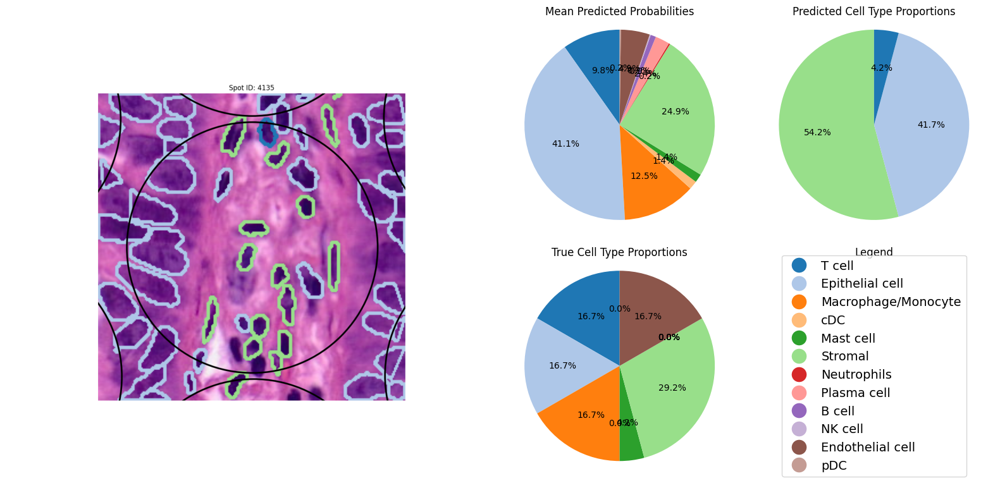

In [117]:
analyzer.plot_spot_proportions(spot_id='4135', draw_seg=True) #"ATTAGACACCAGTCCA-1"

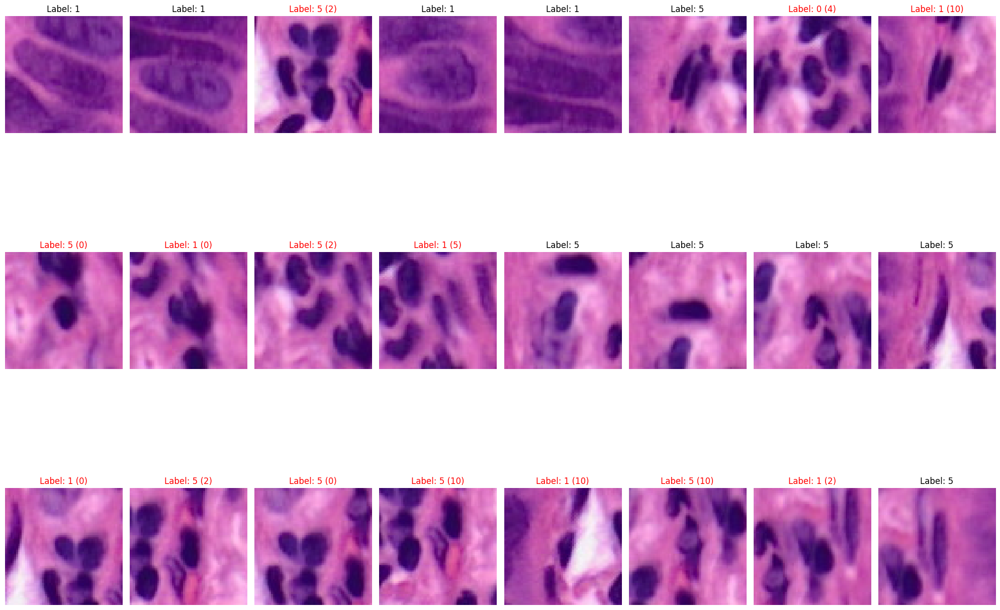

In [118]:
analyzer.plot_mosaic_cells(spot_id='4135')

In [119]:
analyzer.evaluate_spot_predictions()

{'Spearman Correlation': 0.622602935770304,
 'Pearson Correlation': 0.831943941132106,
 'Weighted MSE': 1.8332362724406517e-05,
 'MSE': 0.009995161578557862,
 'Weighted MAE': 0.00018150196393206864,
 'MAE': 0.045045778976311956,
 'R^2 Score': 0.12044522960673591,
 'Balanced Accuracy': 0.13430722526200814,
 'Weighted F1 Score': 0.7057001077537232,
 'Weighted Precision': 0.6504916816481292,
 'Weighted Recall': 0.7758620689655172}

In [120]:
perf = analyzer.evaluate_cell_predictions()
perf

{'Global Accuracy': 0.6603109656301146,
 'Balanced Accuracy': 0.12294762097212127,
 'Weighted F1 Score': 0.5632689407450326,
 'F1 Score (Per Class)': {'B cell': 0.0,
  'Endothelial cell': 0.0,
  'Epithelial cell': 0.8271888679446152,
  'Macrophage/Monocyte': 0.0,
  'Mast cell': 0.0,
  'NK cell': 0.0,
  'Neutrophils': 0.0,
  'Plasma cell': 0.0,
  'Stromal': 0.40822185970636216,
  'T cell': 0.056296036478428624,
  'cDC': 0.0,
  'pDC': 0.0},
 'Weighted Precision': 0.5400239663607099,
 'Precision (Per Class)': {'B cell': 0.0,
  'Endothelial cell': 0.0,
  'Epithelial cell': 0.7168955223880596,
  'Macrophage/Monocyte': 0.0,
  'Mast cell': 0.0,
  'NK cell': 0.0,
  'Neutrophils': 0.0,
  'Plasma cell': 0.0,
  'Stromal': 0.36189043790131314,
  'T cell': 0.5651408450704225,
  'cDC': 0.0,
  'pDC': 0.0},
 'Weighted Recall': 0.6603109656301146,
 'Recall (Per Class)': {'B cell': 0.0,
  'Endothelial cell': 0.0,
  'Epithelial cell': 0.9775896266911395,
  'Macrophage/Monocyte': 0.0,
  'Mast cell': 0.0,
